# In-vivo evidence for increased tau deposition in temporal lobe epilepsy

## Content
1. Participants
1.  *Figure 2:* Relationship to clinical and cognitive variables

# **Figure 2:** Relationship to clinical and cognitive variables


In [1]:
# Libraries
import numpy as np
import pandas as pd 

# Load utilities functions from utils.py
from utils import *

### Fetch data

In [2]:
osf_path="/Users/rcruces/Desktop/OSF_data_revision-2025"

# Load the data frame
osf_df = osf_download("18F-MK6240_in-vivo_database.csv", project_id='ct3gw')
df = pd.read_csv(osf_df)
#df = pd.read_csv(f"{osf_path}/18F-MK6240_in-vivo_database_osf.csv")

# Load processed 18F-MK6240 PET data | matrix:{vertices x subjects}
osf_pet_raw = osf_download("surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy", project_id='ct3gw')
pet_raw = np.load(osf_pet_raw)
#pet_raw = np.load(f"{osf_path}/surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy")

# Load fsLR-32 surface
fslr32k_lh = fetch_surface('fsLR-32k.L.surf.gii')
fslr32k_rh = fetch_surface('fsLR-32k.R.surf.gii')
fslr32k = fetch_template_surface("fslr32k", join=True)

# Load fsLR-32k middle wall mask
fslr32k_mask = fetch_mask("fslr32k")


Found file: 18F-MK6240_in-vivo_database.csv


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 48.9k/48.9k [00:00<00:00, 6.56Mbytes/s]


Downloaded 18F-MK6240_in-vivo_database.csv to /var/folders/yv/7rdtqnkn0mb58f5x_yprm2gw0000gn/T/tmprj3wm236/18F-MK6240_in-vivo_database.csv
Found file: surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████| 39.5M/39.5M [00:05<00:00, 7.86Mbytes/s]


Downloaded surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy to /var/folders/yv/7rdtqnkn0mb58f5x_yprm2gw0000gn/T/tmpzsnmjw_w/surf-fsLR-32k_desc-GroupData_smooth-10mm_pvc-probGM_ref-cerebellarGM_trc-18Fmk6240_pet.npy


### Sort the matrices into ipsilateral/contralateral relative to seizure focus

In [3]:
# fsLR-32k length
n_64k = pet_raw.shape[1]
n_32k = int(n_64k/2)

# Transparency of non-significant vertices (1= no transparency, 0=transparent)
alpha = 1

# Save the figure
save_fig=False

# Calculate the zscore
hc = df['group'].values=="Healthy"
mu = np.nanmean(pet_raw[hc, :], axis=0)
sd = np.nanstd(pet_raw[hc, :], axis=0, ddof=1)
pet_z = (pet_raw - mu) / sd

# Flip R >> L 18F-mk6240 zscores
mkz_ipsi, mkz_contra = flip_mat(pet_z[:,0:n_32k], pet_z[:,n_32k:n_64k], df['lateralization'].values, flip='R')

# Merge ipsi and contra
tauMK6240z = np.concatenate((mkz_ipsi, mkz_contra), axis=1)


Flipping data from Right to Left


-----------------

### A | Tau MK6240 SUVR and clinical relationships

### Effect of age

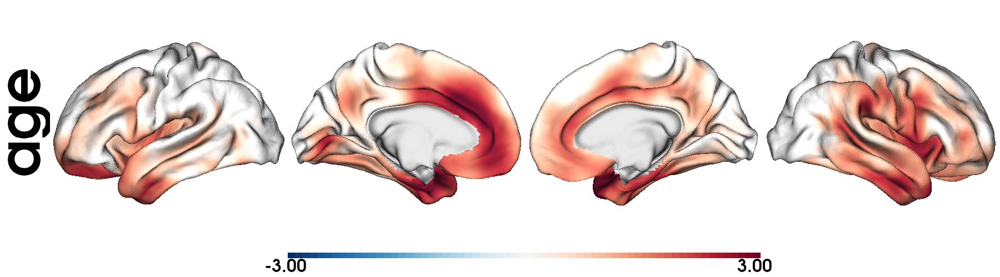

In [4]:
fig, slm =slm_surf(df, tauMK6240z, feat='age', neg_tail=False, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_age_tmap.png")
fig

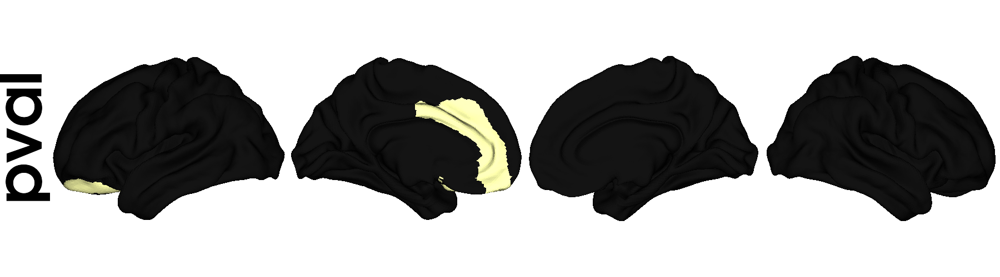

In [5]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=save_fig, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_age_pval.png", scale=2)

### Effect of duration

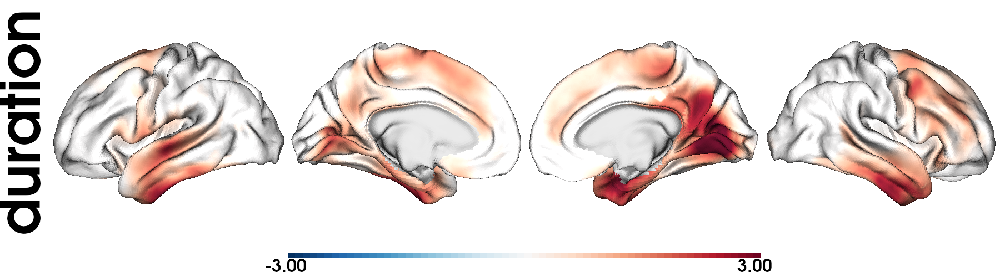

In [6]:
# Slice only Patients
idx = df['group'] == 'Patient'

fig, slm = slm_surf(df[idx], tauMK6240z[idx,:], feat='duration', neg_tail=False, alpha=alpha, cthr=0.025, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_duration_tmap.png")
fig

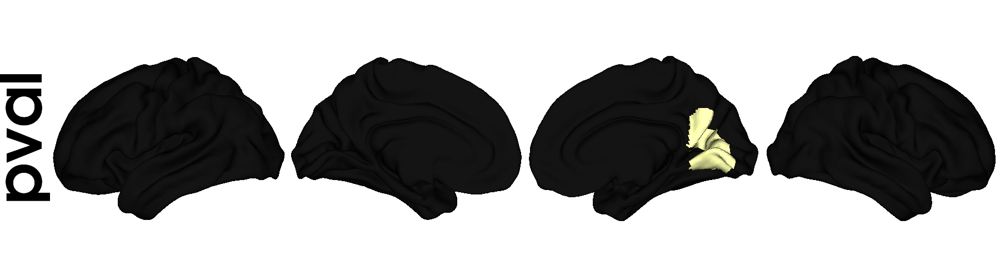

In [7]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=save_fig, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_duration_pval.png", scale=2)

### Effect of onset

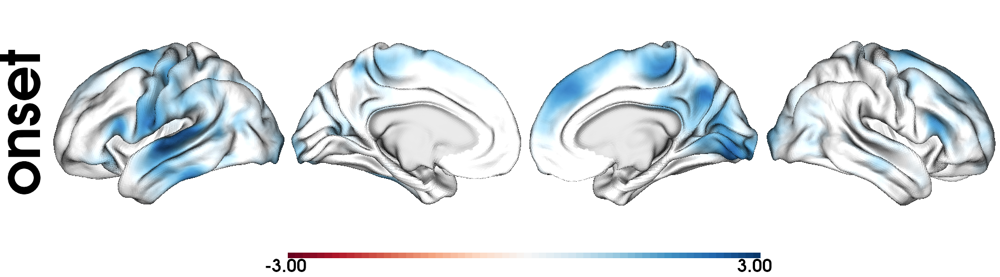

In [8]:
# Create variable onset
df['onset'] = df['age'] - df['duration']

# Slice only the Patients
idx = df['group'] == 'Patient'

fig, slm = slm_surf(df[idx], tauMK6240z[idx,:], feat='onset', neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_onset_tmap.png")
fig

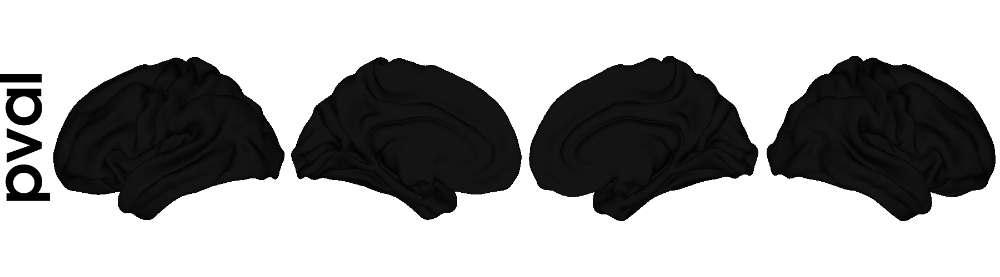

In [9]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=False, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_onset_pval.png", scale=2)

### B | Tau MK6240 SUVR and behavioral relationships

### Epitrack score

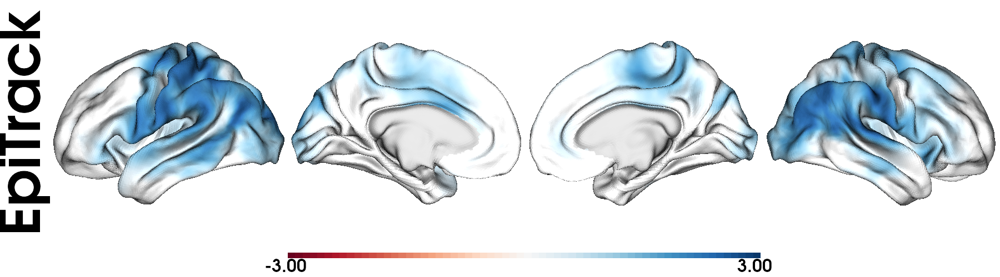

In [10]:
fig, slm = slm_surf(df, feat='EpiTrack', Y=tauMK6240z, neg_tail=True, alpha=alpha, cthr=0.025, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_epitrack_tmap.png")
fig

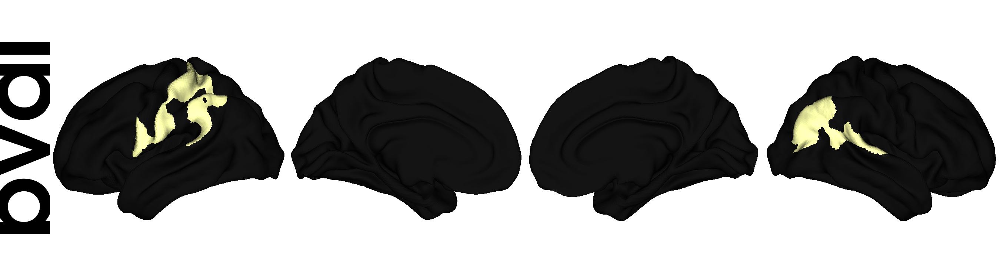

In [11]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=save_fig, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_epitrack_pval.png", scale=3)

### Episodic memory

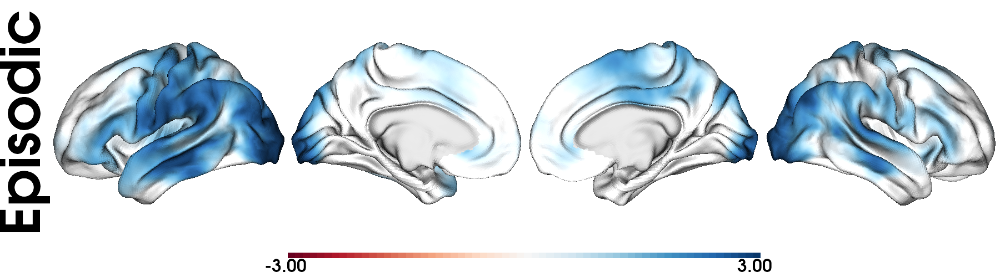

In [12]:
fig, slm = slm_surf(df, feat='Episodic', Y=tauMK6240z, neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_episodic_tmap.png")
fig

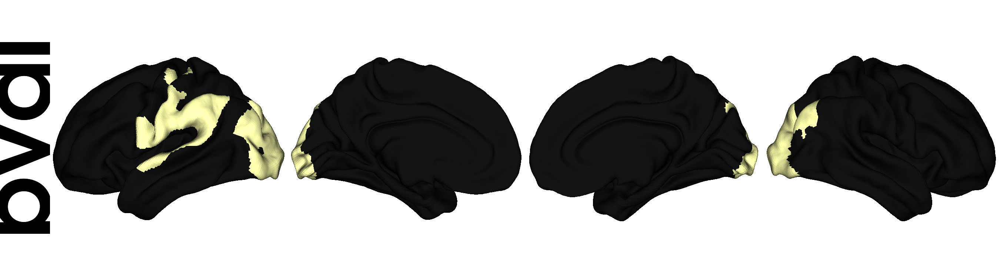

In [13]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=save_fig, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_episodic_pval.png", scale=3)

### Semantic memory

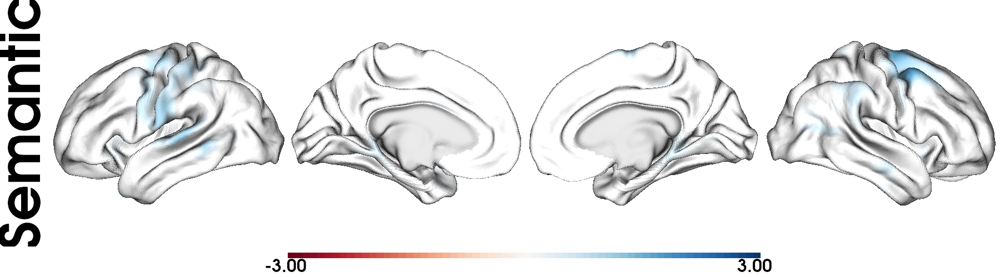

In [14]:
fig, slm = slm_surf(df, feat='Semantic', Y=tauMK6240z, neg_tail=True, cthr=0.05, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_semantic_tmap.png")
fig

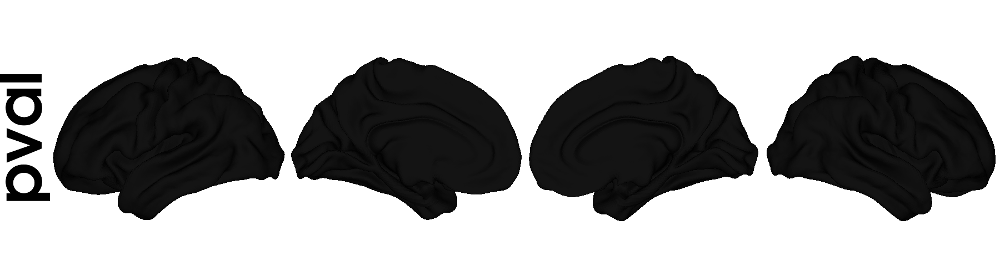

In [15]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=False, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_semantic_pval.png", scale=2)

### Effect of duration controlled for age

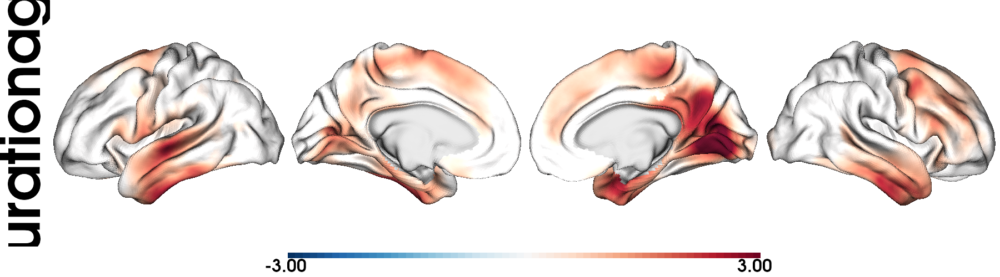

In [16]:
from sklearn.linear_model import LinearRegression

# Subset the dataframe for the relevant index
sub_df = df.loc[idx, ['age', 'duration']]

# Drop rows with any NA values in these columns
sub_df = sub_df.dropna()

# Extract X and y
X = sub_df[['age']]  # 2D array
y = sub_df['duration']

# Create linear regression object
mod = LinearRegression()

# Fit the model
mod.fit(X, y)

# Generate predicted values
predic = mod.predict(X)

# Compute residuals
df.loc[sub_df.index, 'durationage'] = y - predic

# Apply slm_surf
fig, slm = slm_surf(df.loc[sub_df.index], tauMK6240z[sub_df.index, :], 
         feat='durationage', neg_tail=False, cthr=0.025, scale=2, alpha=alpha,
         nan_color=(0.8, 0.8, 0.8, 1), Save=False, png_file=f"{osf_path}/fig3_durationAge_tmap.png")
fig

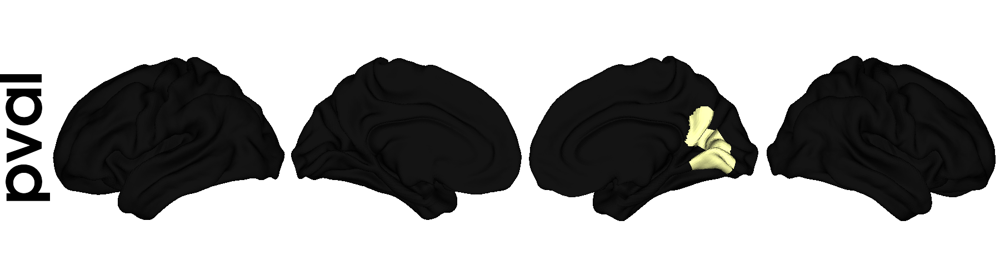

In [17]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=False, Col="inferno", Thr=0.025, scale=2)


-----------------

# Supplementary Figure: Relationships with hippocampal volume

## A | Tau MK6240 SUVR and **Ipsilateral** Hippocampal volume

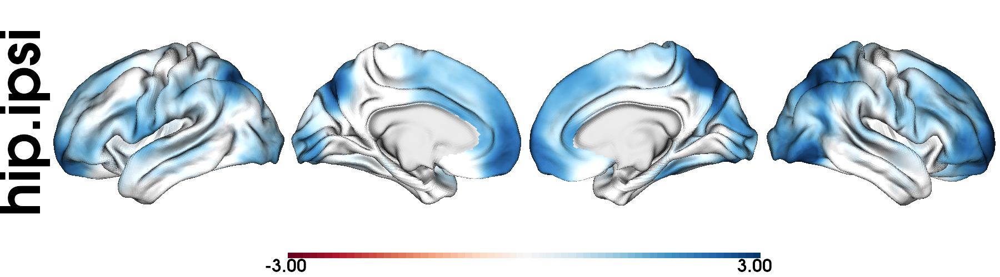

In [18]:
fig, slm = slm_surf(df, feat='hip.ipsi', Y=tauMK6240z, neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_hipipsi_tmap.png")
fig

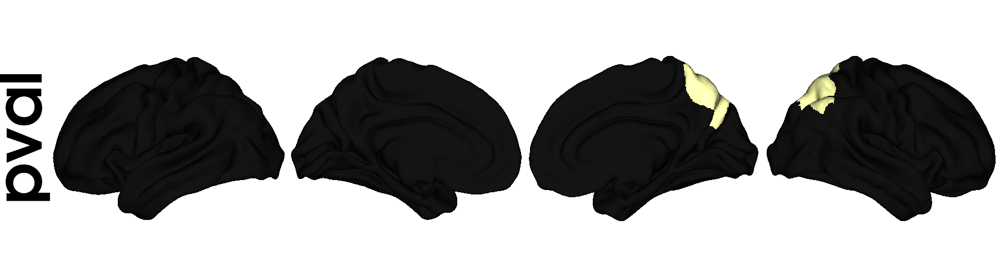

In [19]:
plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=save_fig, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_hipipsi_pval.png", scale=2)

## B | Tau MK6240 SUVR and **Contralateral** Hippocampal volume

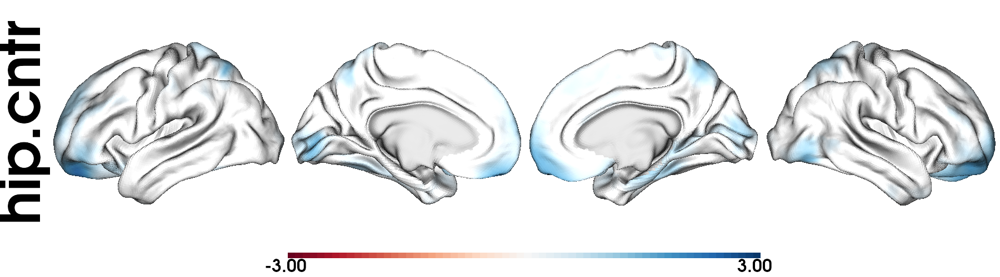

In [20]:
fig, slm = slm_surf(df, feat='hip.cntr', Y=tauMK6240z, neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/fig3_hipcntr_tmap.png")
fig

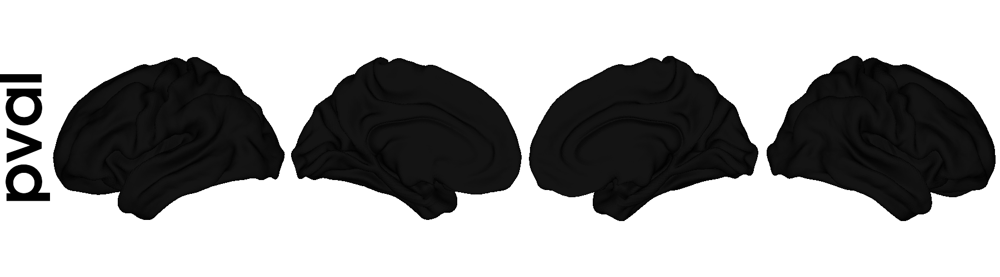

In [21]:
 plot_ctx_pval(fslr32k_lh, fslr32k_rh, slm, Str='pval', Save=False, Col="inferno", Thr=0.025, 
              png_file=f"{osf_path}/fig3_hipcntr_pval.png", scale=2)

## C | Tau MK6240 SUVR and Interictal epileptiform discharge frequency (IEDs)

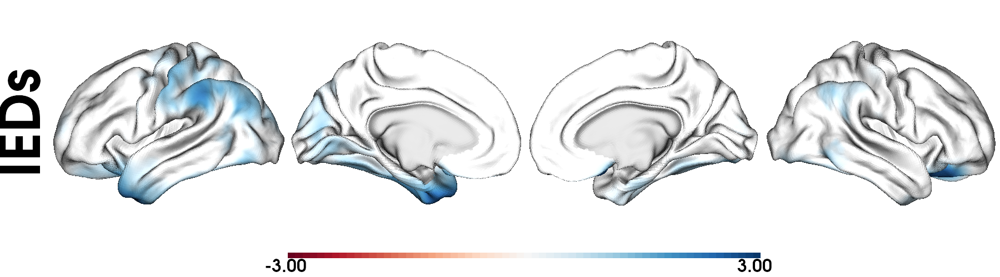

In [22]:
fig, slm = slm_surf(df[idx], feat='IEDs', Y=tauMK6240z[idx], neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/sup5_ieds_tmap.png")
fig

## D | Tau MK6240 SUVR and Interictal generalized tonic-clonic seizures frequency (GTCSF)

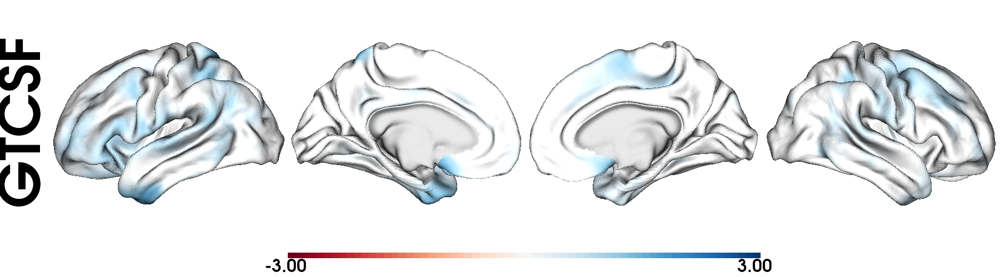

In [23]:
fig, slm = slm_surf(df[idx], feat='GTCSF', Y=tauMK6240z[idx], neg_tail=True, cthr=0.025, alpha=alpha, nan_color=(0.8, 0.8, 0.8, 1),
        scale=2, Save=save_fig, png_file=f"{osf_path}/sup5_gtcsf_tmap.png")
fig